In [1]:

import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime


warnings.filterwarnings('ignore')

In [5]:

# Load the data
df = pd.read_csv('D:\\TaskFolder\\food_prices_ind.csv', low_memory=False)


# Cleaning and Preprocessing the data
df['latitude'] = df['latitude'].replace(np.nan, 20.5937)
df['longitude'] = df['longitude'].replace(np.nan, 78.9629)
df[['admin1', 'admin2']] = df[['admin1', 'admin2']].replace(np.nan, 'India')
# Filter out rows with invalid 'date' values
df = df[df['date'].str.startswith('#') == False]

In [7]:

# Convert 'date' column to datetime format
try:
    df['date'] = pd.to_datetime(df['date'])
except pd.errors.DateParseError as e:
    print(f"Error occurred while parsing dates: {e}")


# Convert selected columns to float data type
df[['latitude', 'longitude', 'price', 'usdprice']] = df[['latitude', 'longitude', 'price', 'usdprice']].astype('float')

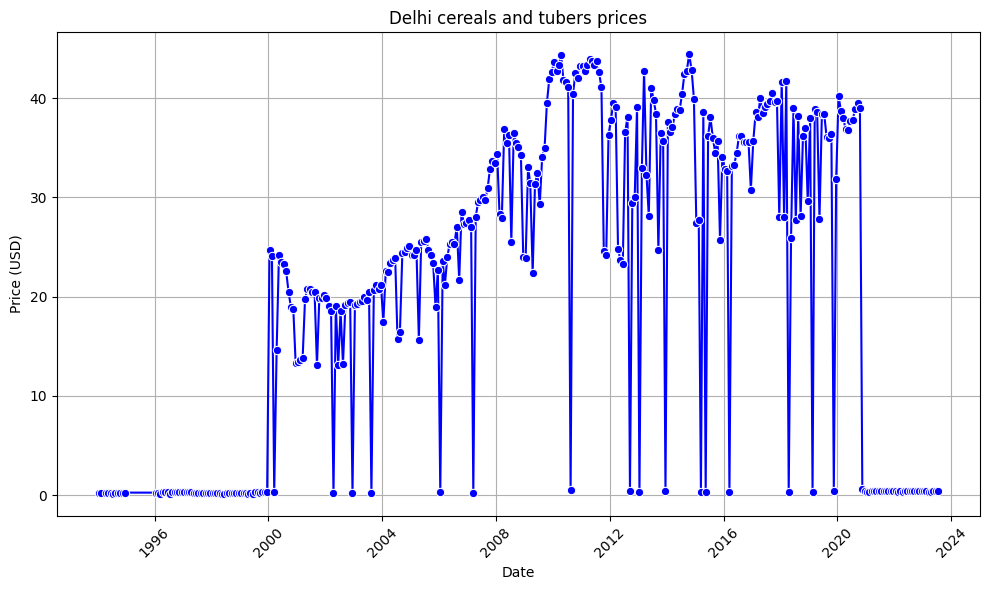

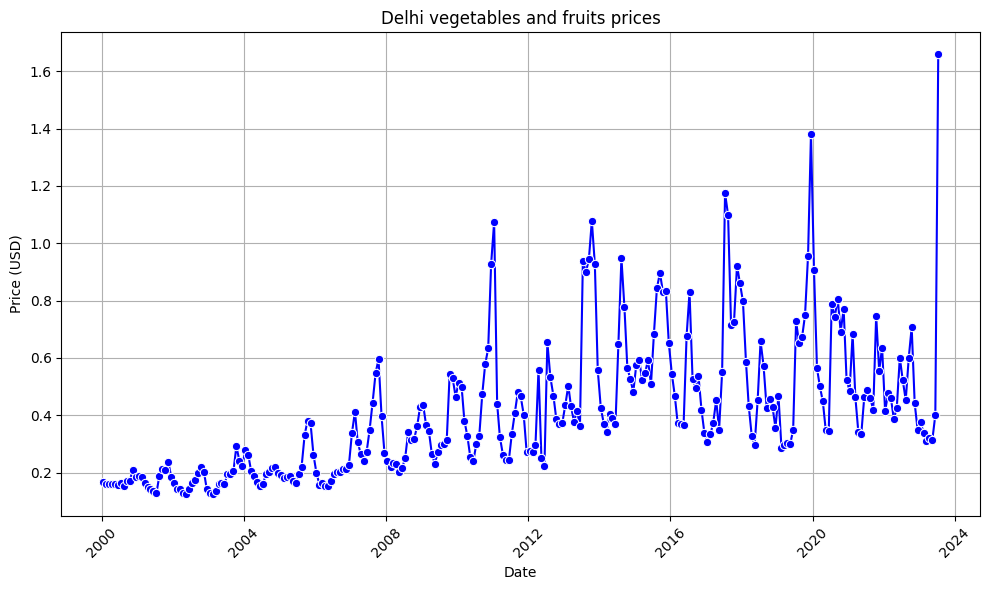

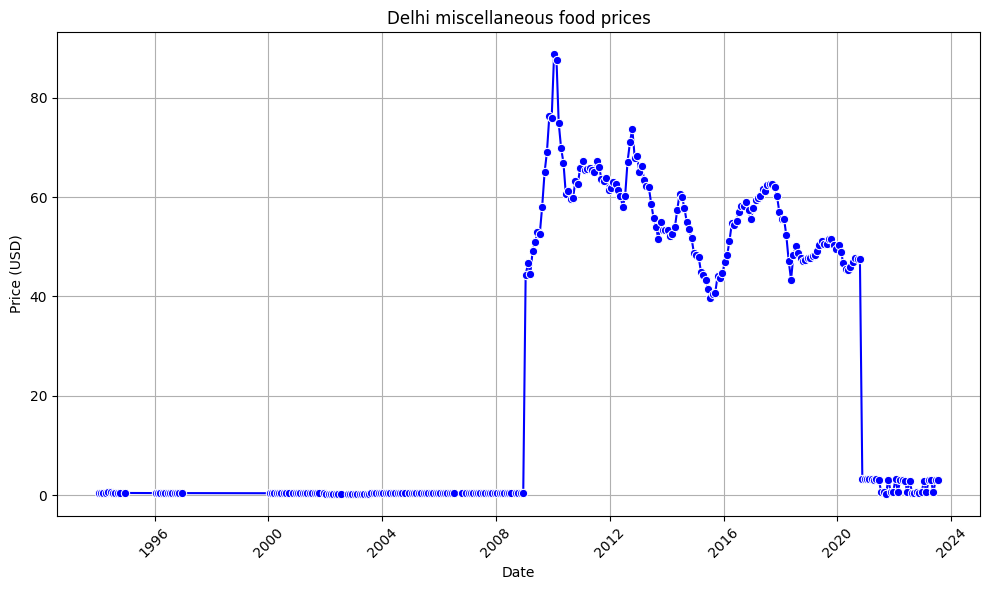

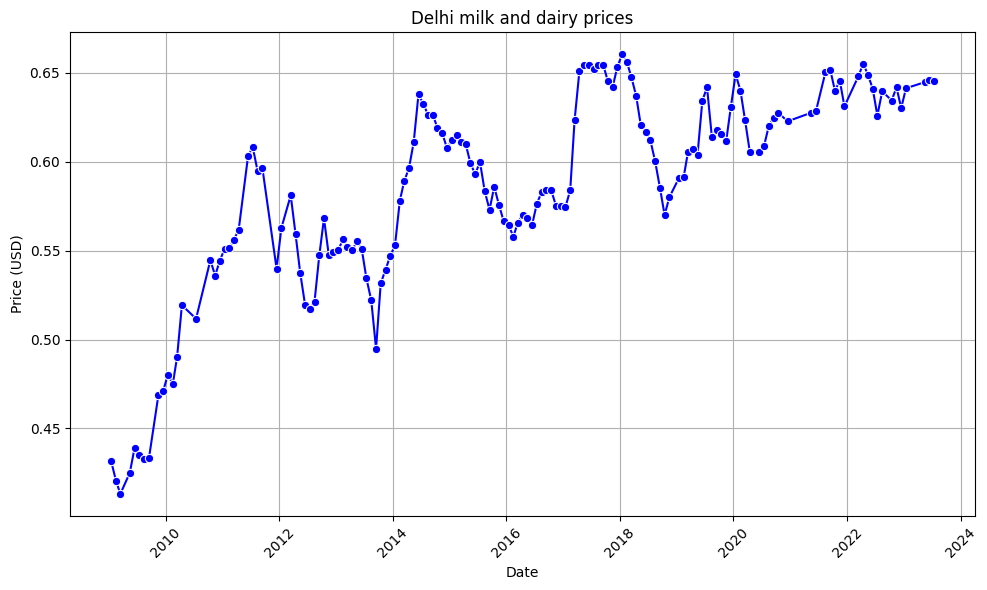

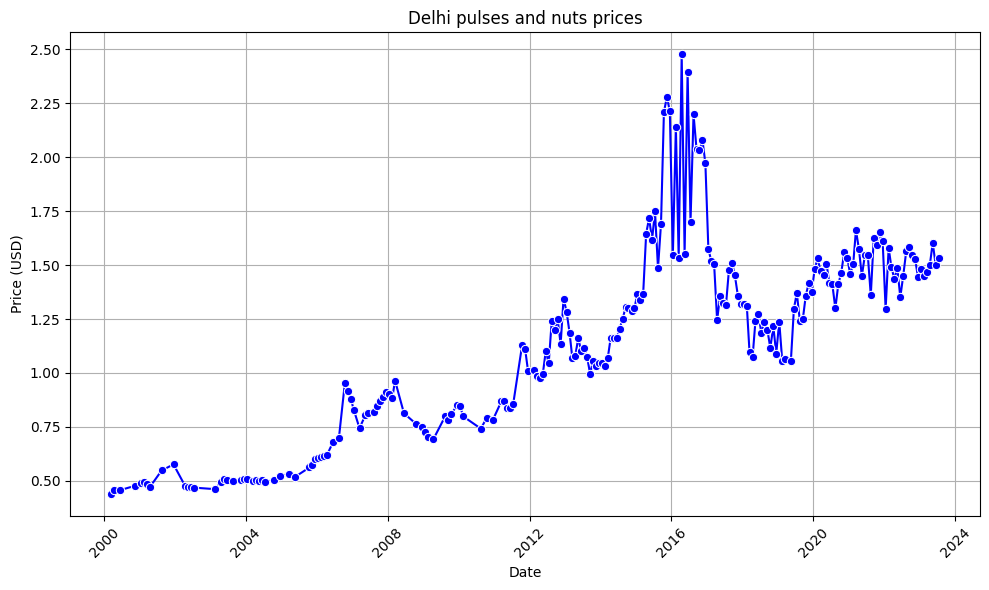

...

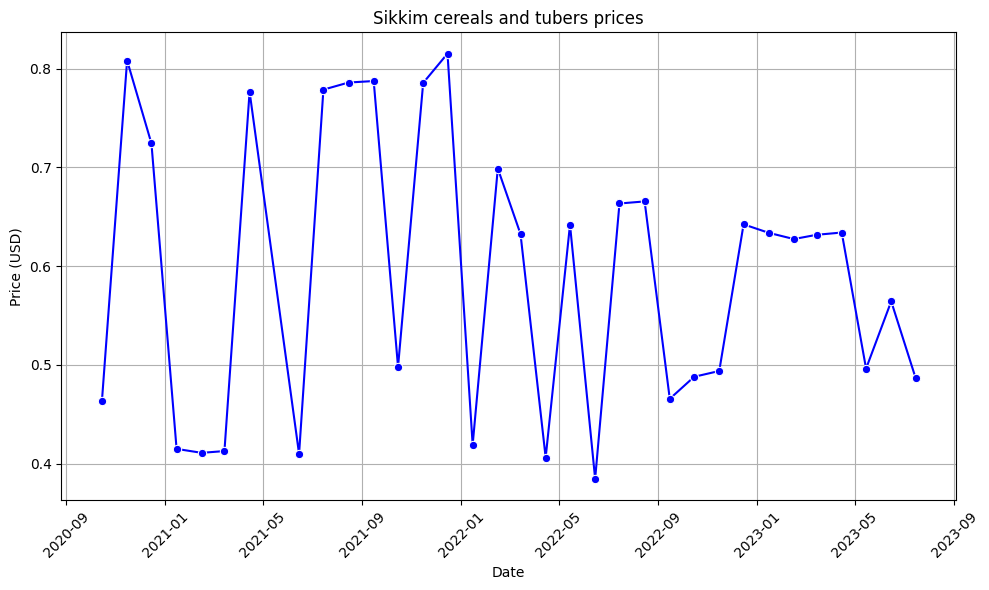

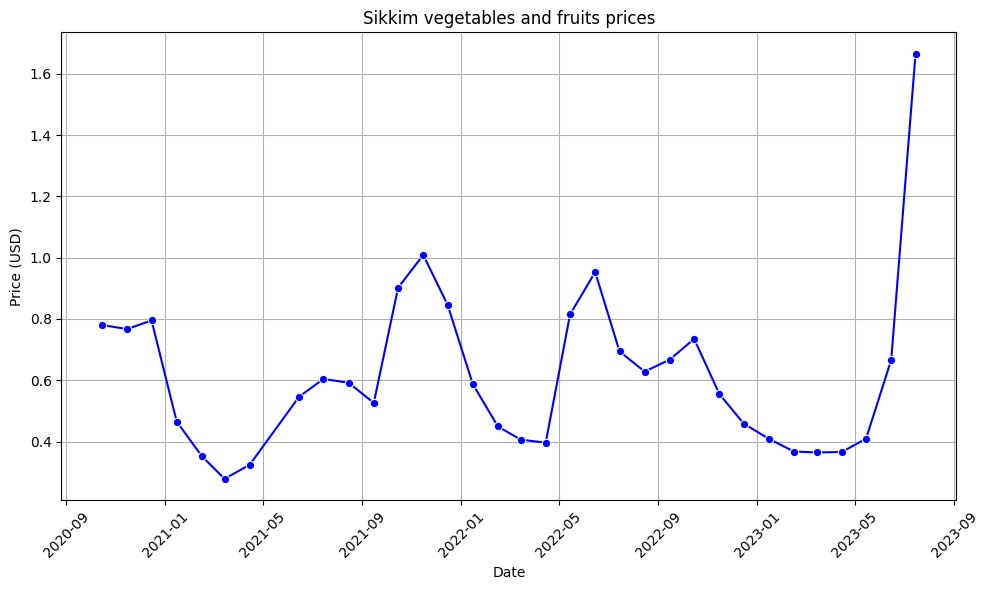

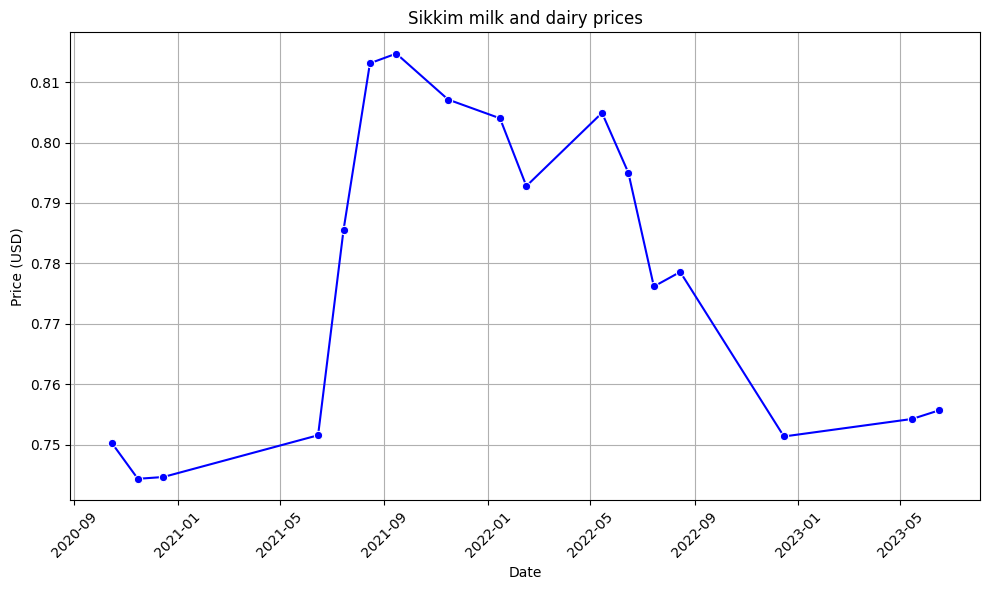

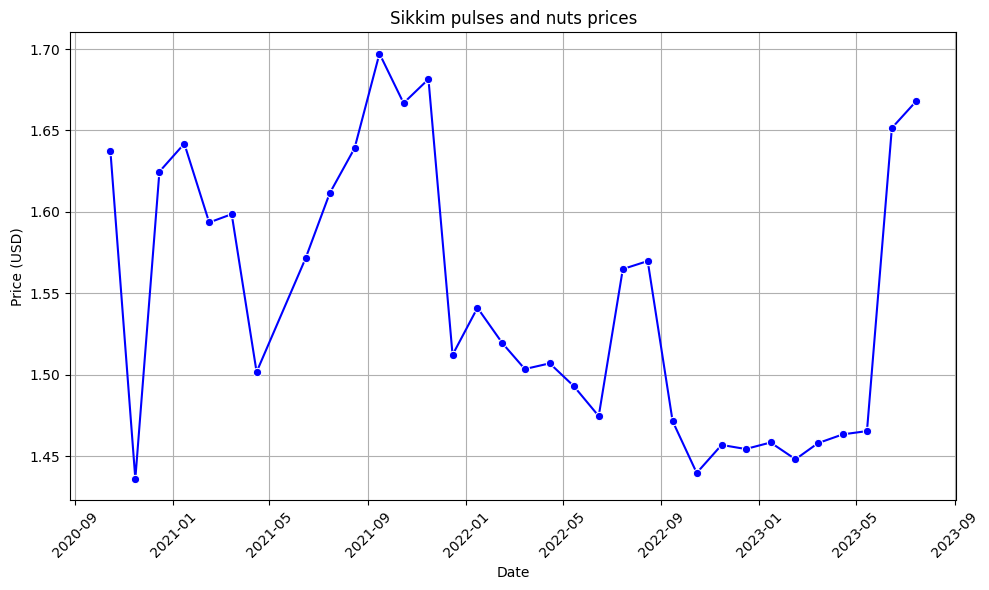

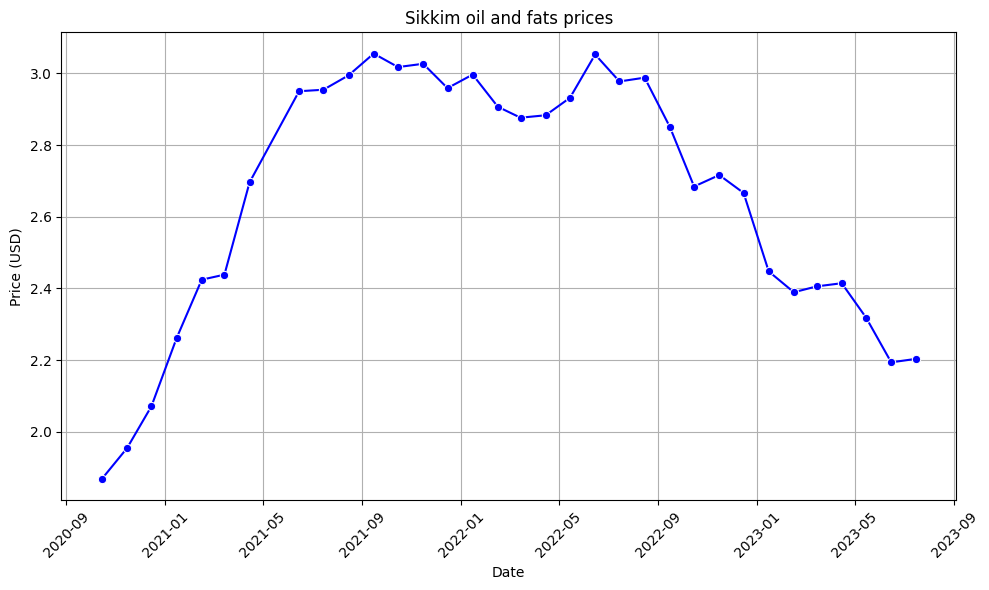

In [8]:

# Iterate over each city
for place in df.admin1.unique():
    df_place = df.groupby('admin1').get_group(place).sort_values(by='usdprice', ascending=True)
    df_place = df_place[['date', 'market', 'category', 'price', 'usdprice']]


   # For a particular city, different category prices
    for category in df_place.category.unique():
        df_place_category = df_place.groupby('category').get_group(category).sort_values(['date', 'usdprice'], ascending=False)
        df_place_category = df_place_category[['date', 'market', 'category', 'price', 'usdprice']]
        df_place_category.drop_duplicates(subset="date", inplace=True)


       # Use Seaborn for plotting
        plt.figure(figsize=(10, 6))
        sns.lineplot(x='date', y='usdprice', data=df_place_category, marker='o', color='b')
        plt.title(f'{place} {category} prices')
        plt.xlabel('Date')
        plt.ylabel('Price (USD)')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [9]:
print("Bye Bye")

Bye Bye
